# Boosting 

https://medium.com/greyatom/a-quick-guide-to-boosting-in-ml-acf7c1585cb5\
https://www.analyticsvidhya.com/blog/2017/03/imbalanced-classification-problem/ - Deal with class imbalace

https://www.youtube.com/watch?v=WkFtIqWmX9o - Best video till now.

https://www.youtube.com/watch?v=NLRO1-jp5F8  -- krish naik

https://towardsdatascience.com/catboost-vs-light-gbm-vs-xgboost-5f93620723db


Boosting is sequential method of ensemble model and bagging is parrallel method of ensemble model. Bagging will make multiple decision tree simultenously while boosting will make multiple decision tree one by one.

bagging technique had not worked on errors from the model thats why Boosting comes into the picture.

Firstly, boosting technique assign same weights to every data points so that every data point is equally responsible for making a model M1 with data set D1. We are going to make M1 , M2 to Mn model with D1, D2 .... Dn data set.

Formula to assgin weights are W = 1/n where n is number of data points. every decision tree is made upto one depth and we make multiple tree model and then select one week learner M1 from them according to entropy and gini method. Please see screenshot.

New weight for wrong classified points = old weight * e to the power of (Performance value)

New weight for right classified points = old weight * e to the power of -(Performance value)

Sum of New weights are not 1 so we divide each value by sum of total.

Once we make train M1 then test the rest of the data points through M1. We will see the misclassification from M1. Thenn we will updates weights of data points which are misclassified by M1 and When we make M2 then last misclassified data points has now higher probabilty to go for training in M2. This process is going on untill Mn. 

We call all Model as week learner and make strong learner by combining all the models. Final model will predict same as in random forest like voting for classification and mean/median for regression.

## Adaboost changes the sample distribution for each Model by updating the weights of misclassified data points and Gredient Decient Works on improving the loss or residuels by gredient decent optimization technique.

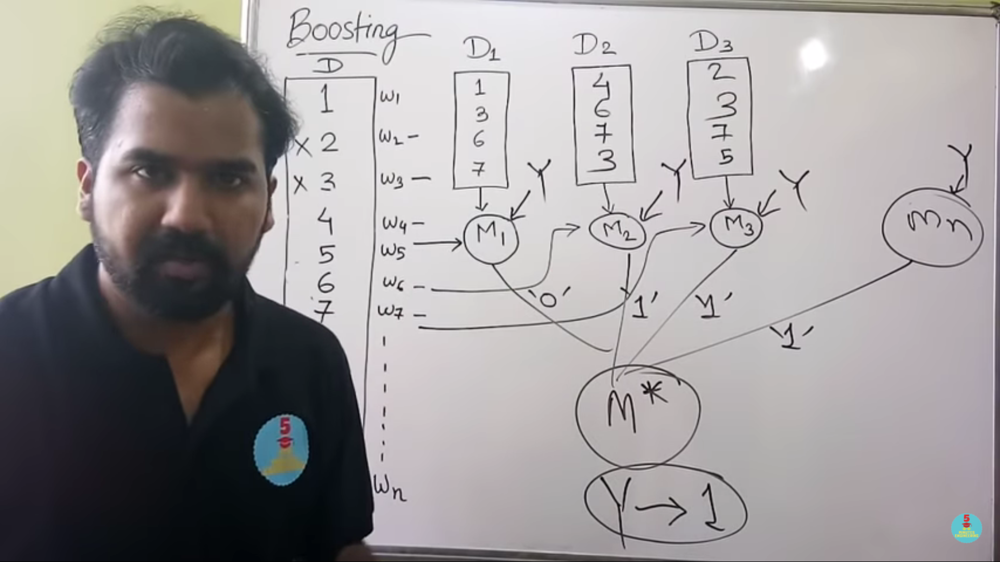

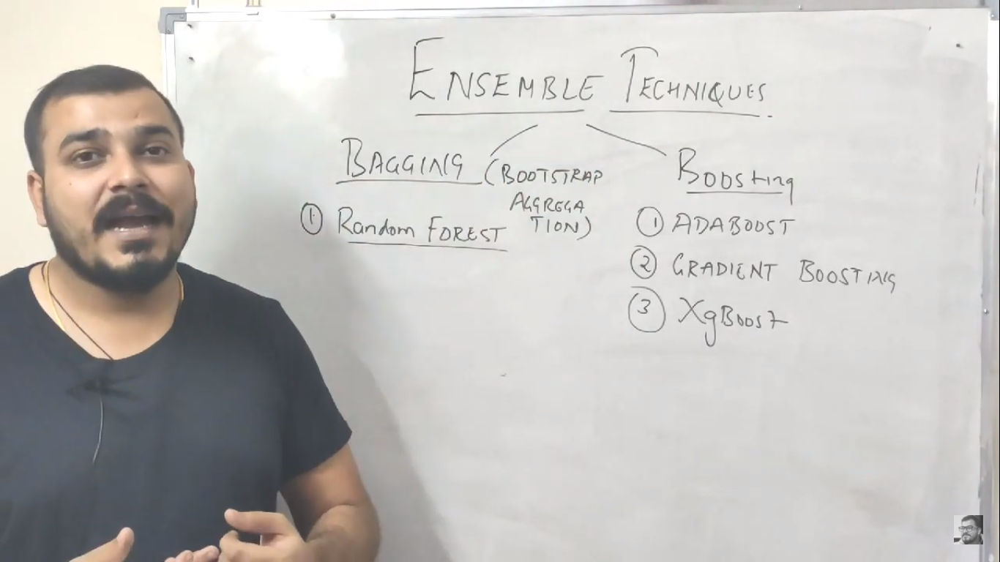

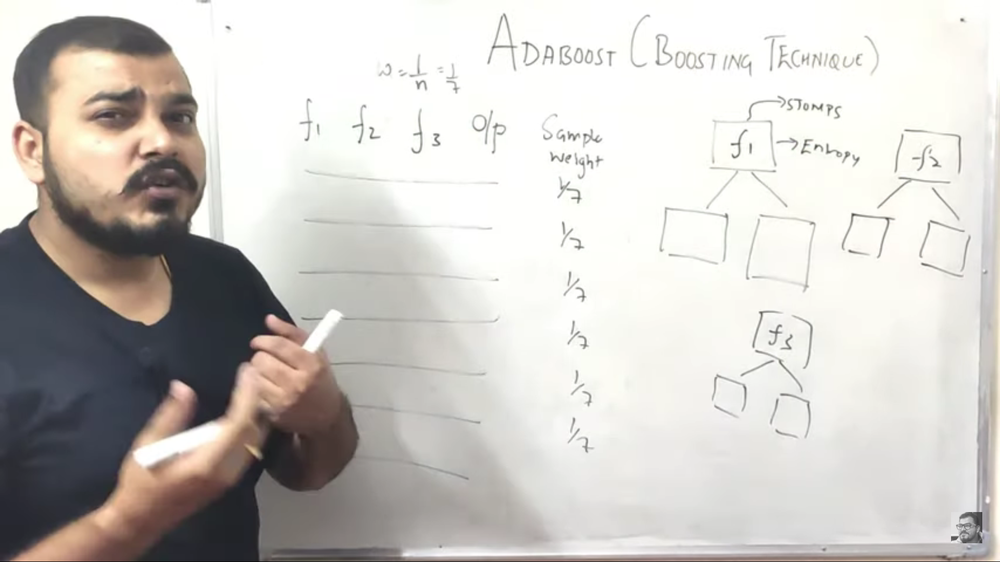

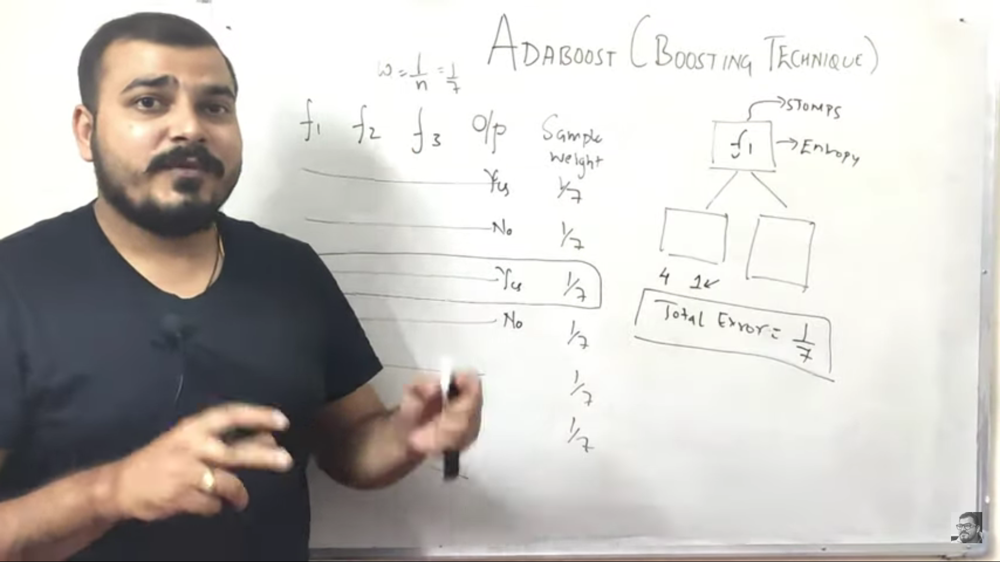

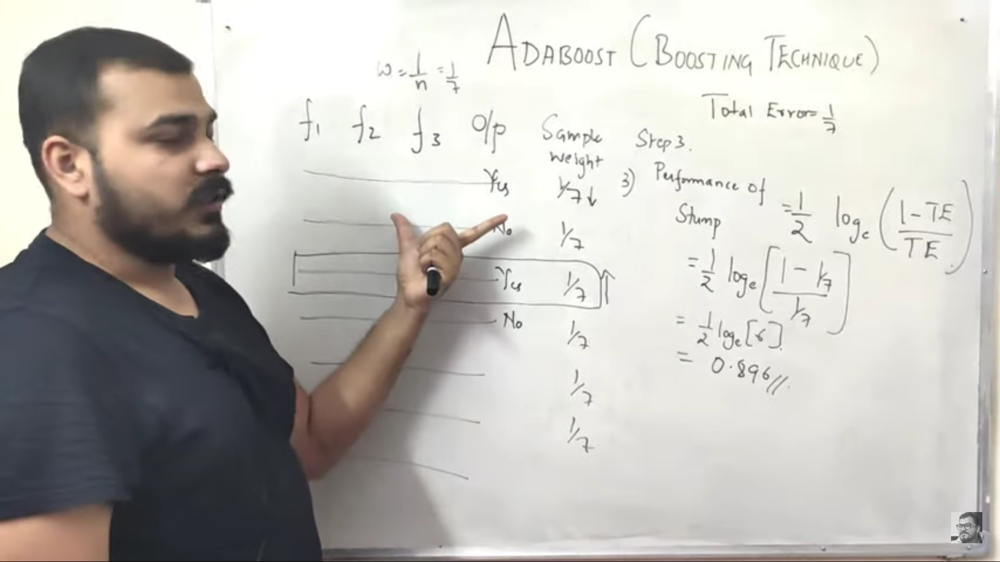

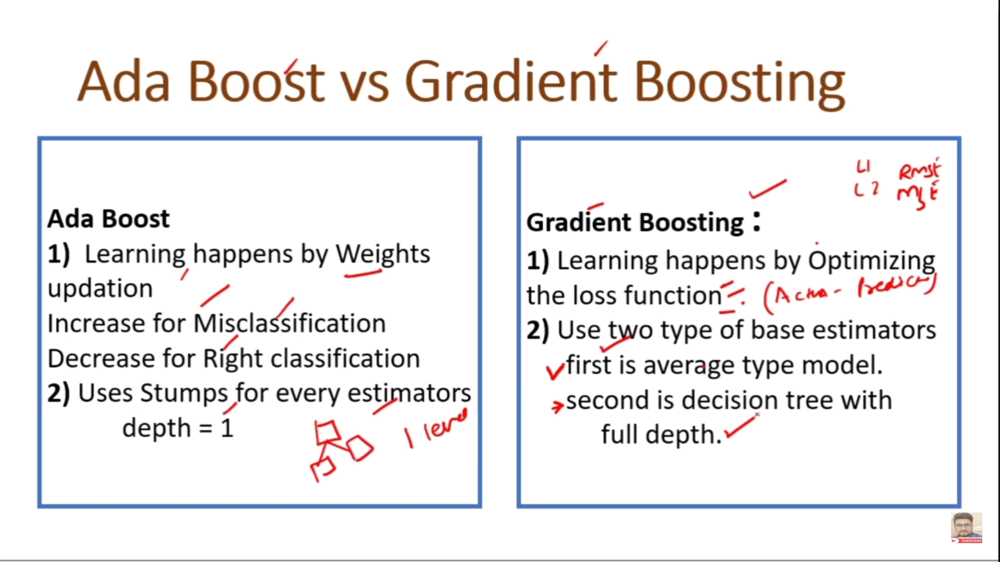

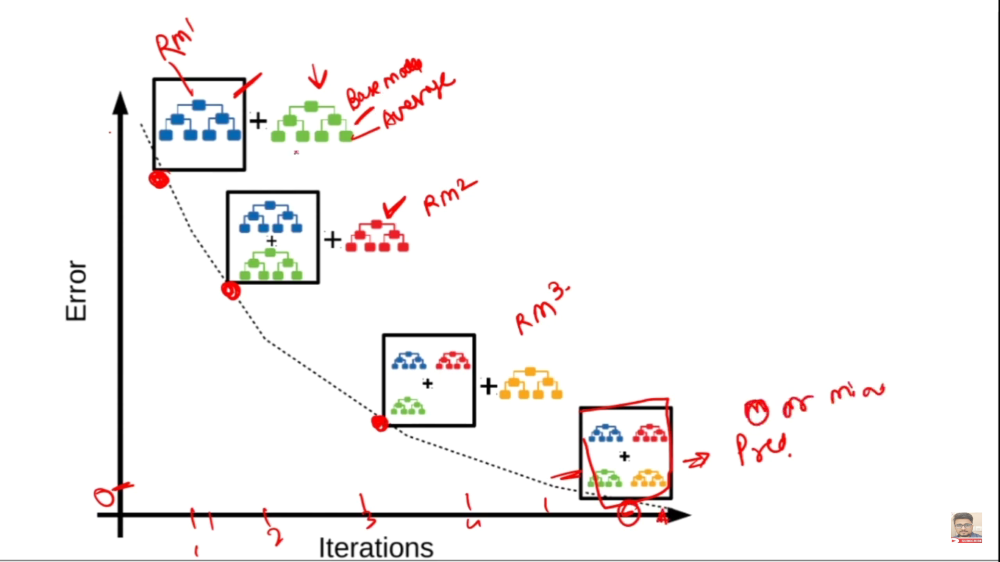

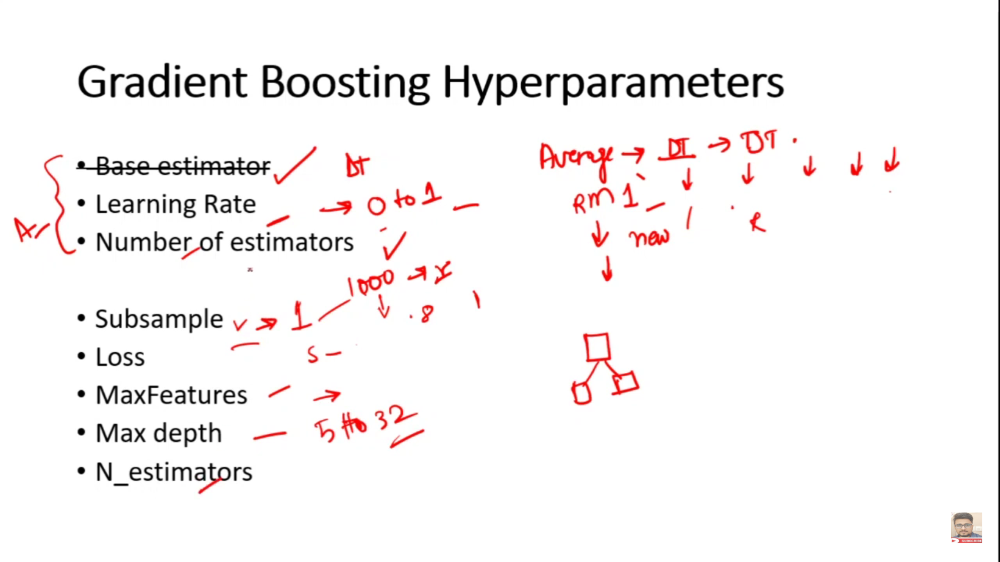

Bagging - It is ensemble method where we use multiples models of same algoriths for diff subset of dataset randomdly.And take the votes to the output.Bagging is an ensemble technique mainly used to reduce the variance of our predictions by combining the results of multiple classifiers modelled on different sub-samples of the same dataset. In Bagging, individual learner are trained in parallel.

Bossting - In this case, we give more emphasis on selecting datasets which gives wrong predicton in order to imporve accuracy.
Boosting builds on weak learners, and in an iterative fashion. In each iteration, a new learner is added, while all existing 
learners are kept unchanged. All learners are weighted based on their performance (e.g., accuracy), and after a weak learner
is added, the data are re-weighted: examples that are misclassified gain more weights, while examples that are correctly
classified lose weights. Thus, future weak learners focus more on examples that previous weak learners misclassified.
Boosting helps in reduse the vairiance and overfitting of the model.

Boosting is a method of converting a set of weak learners into a strong learner. Many algorithms works with the concept of boosting but today, we will talk about three major boosting algorithms. All these boosting methods differ on how they create the weak learners during the iterative process.

GBM generates learners during the learning process and  build first learner to predict labels and calculate the loss and it will build a second learner to predict the loss after the first step and so on. It minimizes the loss function (difference of actual and predictions).

XGBoost is an advanced implementation of GBM having high predictive power (including a variety of regularisation (choose or define), reducing overfitting and improves overall performance) and is many times faster (parallel processing) and also works best in bias-variance tradeoff situations.

AdaBoost is the shortcut for adaptive boosting. So what’s the differences between Adaptive boosting and Gradient boosting?

Both are boosting algorithms which means that they convert a set of weak learners into a single strong learner. They both initialize a strong learner (usually a decision tree) and iteratively create a weak learner that is added to the strong learner. They differ on how they create the weak learners during the iterative process.

At each iteration, adaptive boosting changes the sample distribution by modifying the weights attached to each of the instances. It increases the weights of the wrongly predicted instances and decreases the ones of the correctly predicted instances. The weak learner thus focuses more on the difficult instances. After being trained, the weak learner is added to the strong one according to his performance (so-called alpha weight). The higher it performs, the more it contributes to the strong learner.

On the other hand, gradient boosting doesn’t modify the sample distribution. Instead of training on a newly sample distribution, the weak learner trains on the remaining errors (so-called pseudo-residuals) of the strong learner. It is another way to give more importance to the difficult instances. At each iteration, the pseudo-residuals are computed and a weak learner is fitted to these pseudo-residuals. Then, the contribution of the weak learner (so-called multiplier) to the strong one isn’t computed according to his performance on the newly distribution sample but using a gradient descent optimization process. The computed contribution is the one minimizing the overall error of the strong learner.

In my opinion, gradient boosting and Adaboost are fundamentally different. I think the key word ‘boost’ is misleading here. Adaboost is more about ‘voting weights’ and gradient boosting is more about ‘adding gradient optimization’.

Adaboost doesn’t overfit because it is more about ‘organizing people to vote’ than ‘voting’. In fact, if you have a gradient boosting model, you can use it in adaboost along with other models.

Gradient boosting calculate essentially the gradient of the loss function with respect to the prediction (instead of the features) and this way generates an extra ‘helper prediction’ to enhance the prediction and make the weak prediction closer and closer to y_test. So it can overfit.

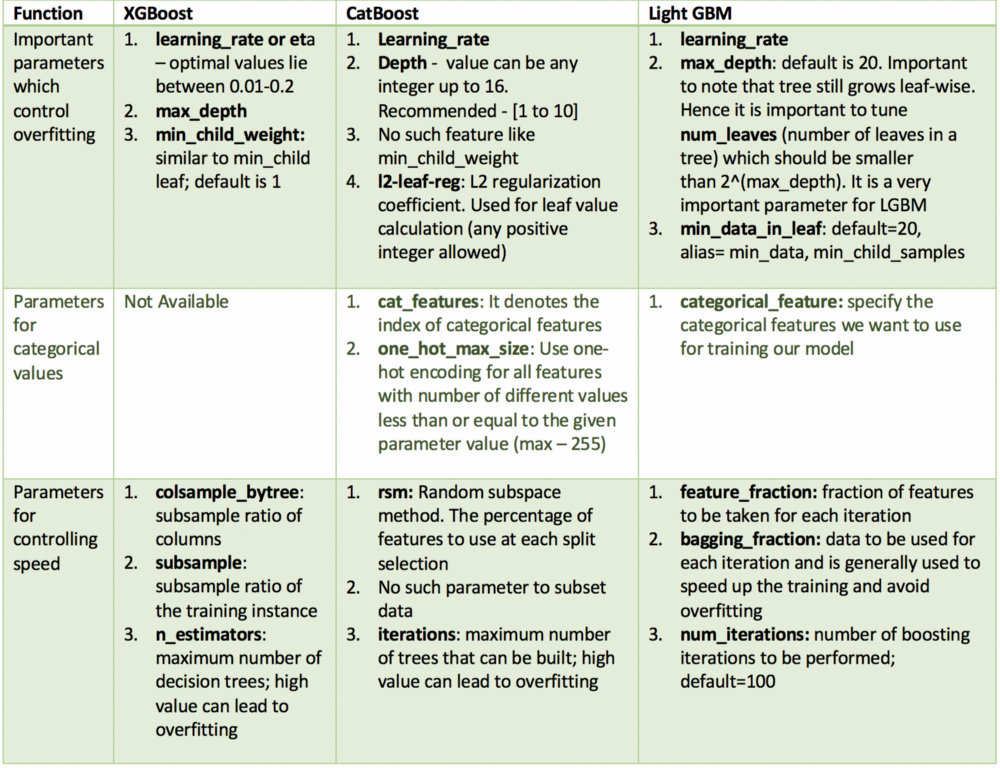

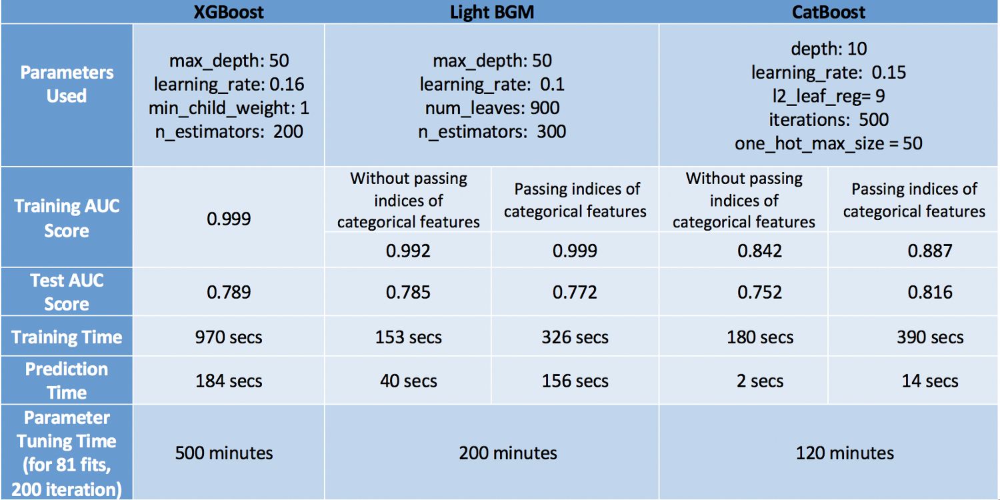

#### First off, CatBoost is designed for categorical data and is known to have the best performance on it, showing the state-of-the-art performance over XGBoost and LightGBM in eight datasets in its official journal article

# ParaMeter Tuning of boosting theorems

In [ ]:
# XG Boost Parameter Tuning 
model = xgb.XGBClassifier()
param_dist = {"max_depth": [10,30,50],
              "min_child_weight" : [1,3,6],
              "n_estimators": [200],
              "learning_rate": [0.05, 0.1,0.16],}
grid_search = GridSearchCV(model, param_grid=param_dist, cv = 3, 
                                   verbose=10, n_jobs=-1)
grid_search.fit(train, y_train)

grid_search.best_estimator_

model = xgb.XGBClassifier(max_depth=50, min_child_weight=1,  n_estimators=200,\
                          n_jobs=-1 , verbose=1,learning_rate=0.16)
model.fit(train,y_train)


In [ ]:

# Light GBM Parameter Tunning

lg = lgb.LGBMClassifier(silent=False)
param_dist = {"max_depth": [25,50, 75],
              "learning_rate" : [0.01,0.05,0.1],
              "num_leaves": [300,900,1200],
              "n_estimators": [200]
             }
grid_search = GridSearchCV(lg, n_jobs=-1, param_grid=param_dist, cv = 3, scoring="roc_auc", verbose=5)
grid_search.fit(train,y_train)
grid_search.best_estimator_

d_train = lgb.Dataset(train, label=y_train)
params = {"max_depth": 50, "learning_rate" : 0.1, "num_leaves": 900,  "n_estimators": 300}

# Without Categorical Features
model2 = lgb.train(params, d_train)

#With Catgeorical Features
cate_features_name = ["MONTH","DAY","DAY_OF_WEEK","AIRLINE","DESTINATION_AIRPORT",
                 "ORIGIN_AIRPORT"]
model2 = lgb.train(params, d_train, categorical_feature = cate_features_name)

In [ ]:
# Cat Boost GBM Parameter Tunning

cb = cb.CatBoostClassifier()
cb_model = GridSearchCV(cb, params, scoring="roc_auc", cv = 3)
cb_model.fit(train, y_train)

With Categorical features
clf = cb.CatBoostClassifier(eval_metric="AUC", depth=10, iterations= 500, l2_leaf_reg= 9, learning_rate= 0.15)
clf.fit(train,y_train)
auc(clf, train, test)

With Categorical features
clf = cb.CatBoostClassifier(eval_metric="AUC",one_hot_max_size=31, \
                            depth=10, iterations= 500, l2_leaf_reg= 9, learning_rate= 0.15)
clf.fit(train,y_train, cat_features= cat_features_index)